# Assignment-2

# Question-1

1. Regression and out-of-distribution prediction:

a. Download the wine quality datasets from https://archive.ics.uci.edu/ml/datasets/Wine+Quality .

In [ ]:
pip install ucimlrepo # Install the ucimlrepo package

In [ ]:
# Now import the dataset into your code.

In [ ]:
from ucimlrepo import fetch_ucirepo, list_available_datasets

# check which datasets can be from ucimlrepo import fetch_ucirepo, list_available_datasets

# check which datasets can be imported
list_available_datasets()

# import dataset
Wine_Quality = fetch_ucirepo(id=186)
# alternatively: fetch_ucirepo(name='Wine Quality')
# To import some specific data from our datasets , in this case Wine Quality is that specific data.

# access data
X = Wine_Quality.data.features # features of the Wine Quality datasets.
y = Wine_Quality.data.targets  # target value of the Wine Quality datasets.
# train model e.g. sklearn.linear_model.LinearRegression().fit(X, y)

# access metadata
print(Wine_Quality.metadata.uci_id) # Print id of the Wine Quality data from datasets.
print(Wine_Quality.metadata.num_instances) # Information about Wine Quality data.
print(Wine_Quality.metadata.additional_info.summary) # Additional info of Wine Quality data.

# access variable info in tabular format
print("variable information in tabular format:")
print(Wine_Quality.variables) # Shows the variable info in tabular formate.

-------------------------------------
The following datasets are available:
-------------------------------------
Dataset Name                                                                            ID    
------------                                                                            --    
Abalone                                                                                 1     
Adult                                                                                   2     
Annealing                                                                               3     
Audiology (Standardized)                                                                8     
Auto MPG                                                                                9     
Automobile                                                                              10    
Balance Scale                                                                           12    
Balloons                       

b. Explore, visualize, and pre-process the data as appropriate.

Red Wine Data:


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5



White Wine Data:


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


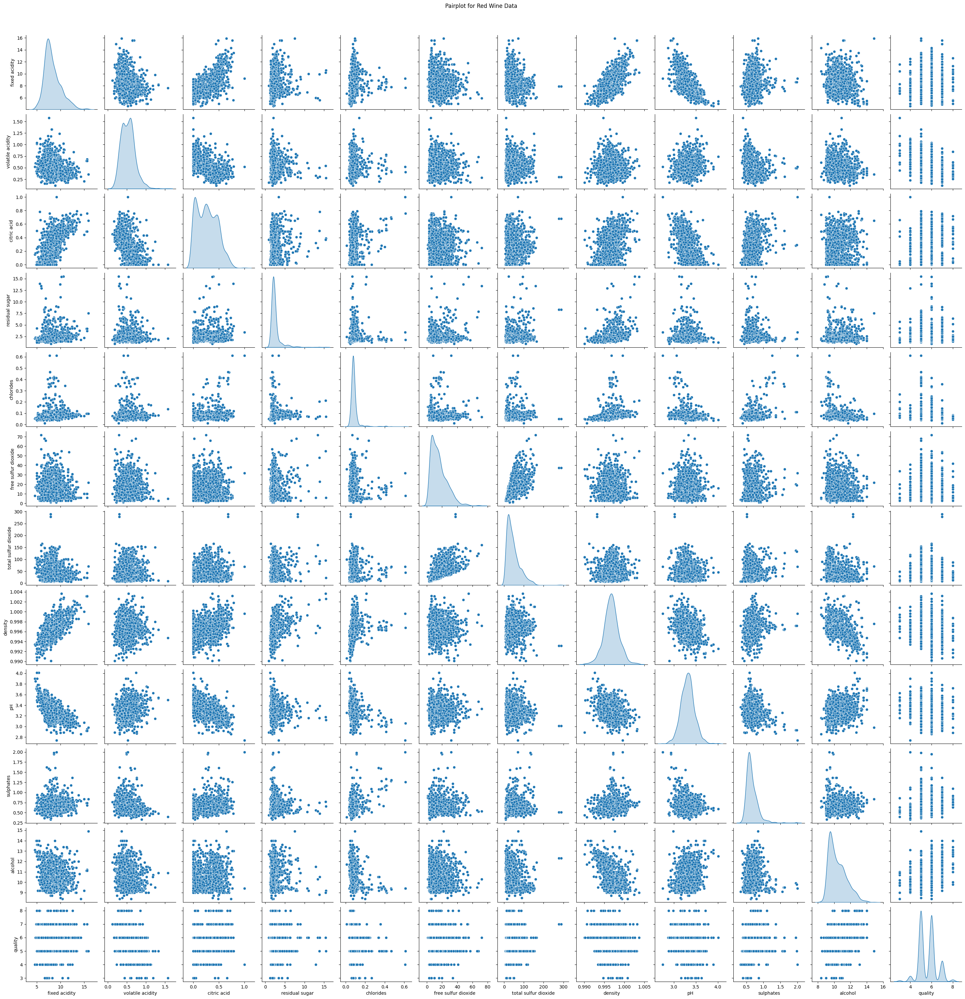

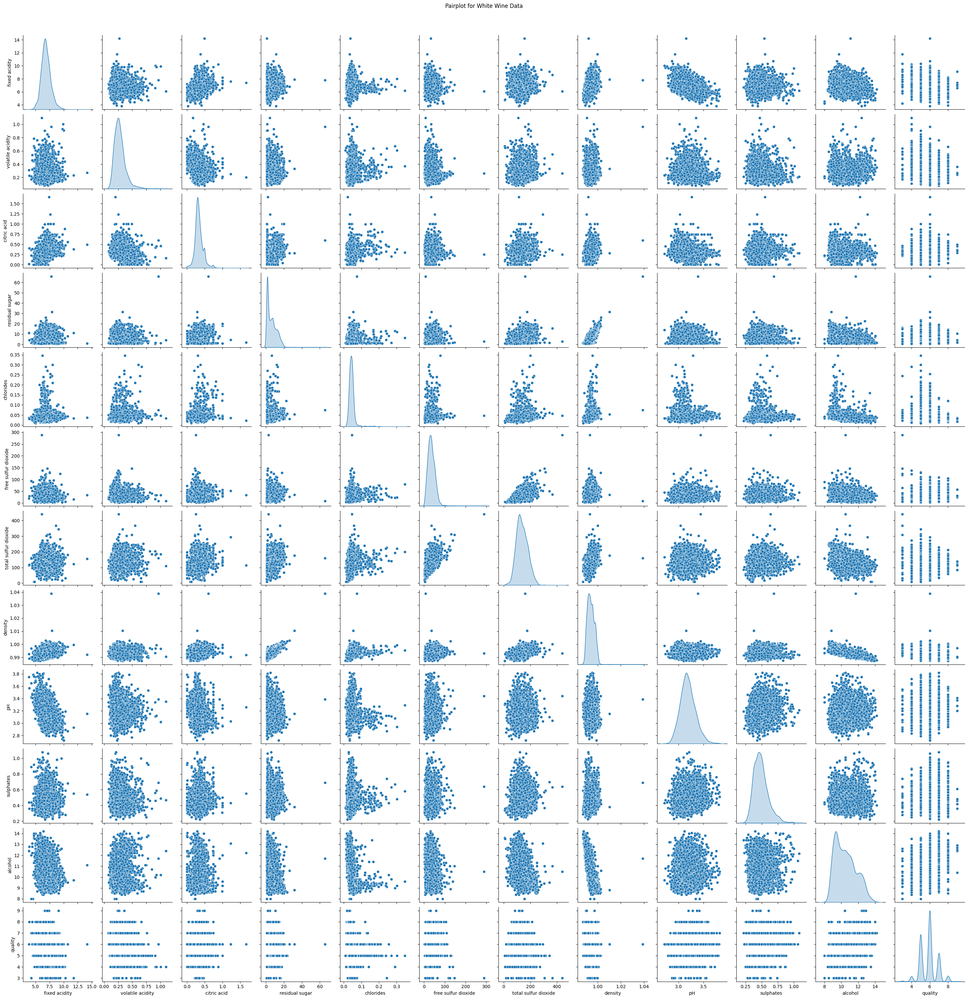

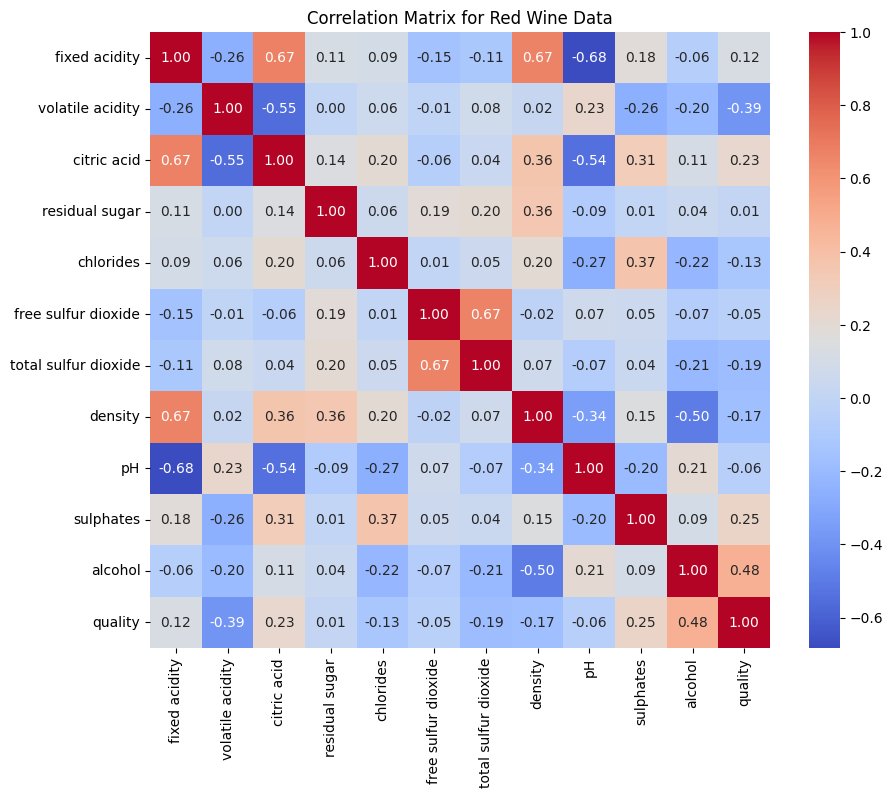

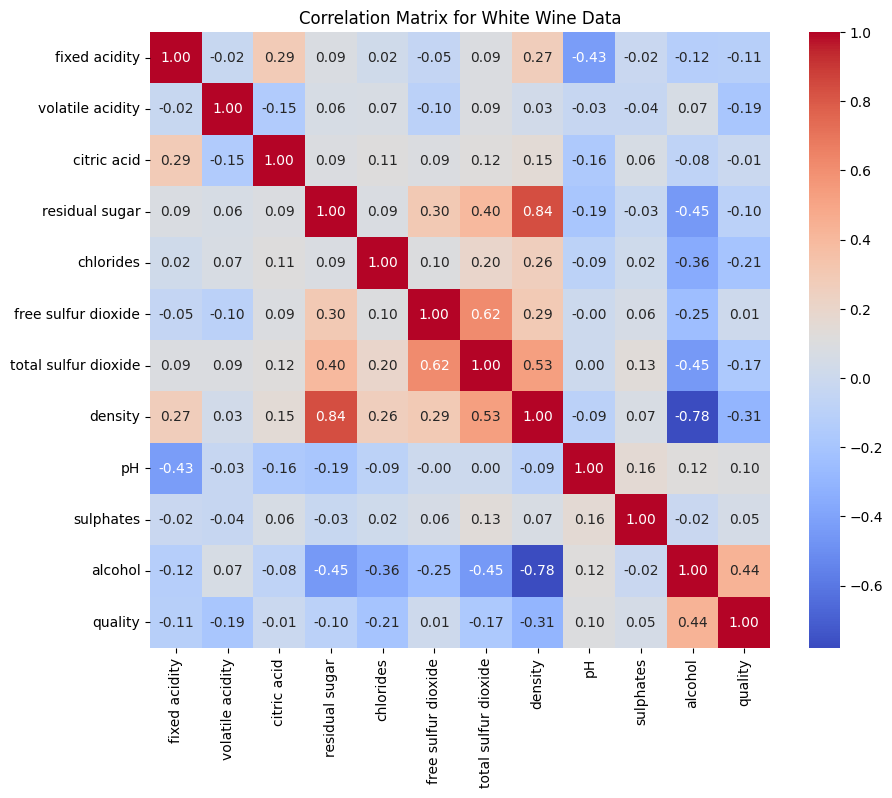

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column        

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

# Load the datasets
red_wine_data_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv"
white_wine_data_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv"

red_wine_data = pd.read_csv(red_wine_data_url, sep=';')  # Load the red wine dataset.
white_wine_data = pd.read_csv(white_wine_data_url, sep=';')  # Load the white wine dataset.

# Data exploration, visualization, preprocessing, and splitting:-
print("Red Wine Data:") # Print in tabular formate.
display(red_wine_data) # Display the red wine data.
print("\nWhite Wine Data:")  # Print in new line and tabular formate.
display(white_wine_data) # Display the white wine data.


# Pairplot for Red Wine Data
sns.pairplot(red_wine_data, diag_kind='kde', markers='o')
plt.suptitle("Pairplot for Red Wine Data", y=1.02)
plt.show()

# Pairplot for White Wine Data
sns.pairplot(white_wine_data, diag_kind='kde', markers='o')
plt.suptitle("Pairplot for White Wine Data", y=1.02)
plt.show()

# Correlation Matrix for Red Wine Data
plt.figure(figsize=(10, 8))
sns.heatmap(red_wine_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix for Red Wine Data")
plt.show()

# Correlation Matrix for White Wine Data
plt.figure(figsize=(10, 8))
sns.heatmap(white_wine_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix for White Wine Data")
plt.show()

red_wine_data.info()

white_wine_data.info()

# Standard scaling for Red Wine Data
scaler_red = StandardScaler()
X_red_scaled = scaler_red.fit_transform(red_wine_data.drop('quality', axis=1))

# Standard scaling for White Wine Data
scaler_white = StandardScaler()
X_white_scaled = scaler_white.fit_transform(white_wine_data.drop('quality', axis=1))

# Split data into features and target variable
y_red = red_wine_data['quality']
y_white = white_wine_data['quality']

# Split scaled data into train and temp sets
X_red_train, X_red_temp, y_red_train, y_red_temp = train_test_split(X_red_scaled, y_red, test_size=0.3, random_state=42)

# Split temp set into validation and test sets
X_red_val, X_red_test, y_red_val, y_red_test = train_test_split(X_red_temp, y_red_temp, test_size=0.5, random_state=42)

# Split scaled data into train and temp sets
X_white_train, X_white_temp, y_white_train, y_white_temp = train_test_split(X_white_scaled, y_white, test_size=0.3, random_state=42)

# Split temp set into validation and test sets
X_white_val, X_white_test, y_white_val, y_white_test = train_test_split(X_white_temp, y_white_temp, test_size=0.5, random_state=42)

# Normalization for Red Wine Data
scaler_red_norm = MinMaxScaler()
X_red_normalized = scaler_red_norm.fit_transform(red_wine_data.drop('quality', axis=1))

# Normalization for White Wine Data
scaler_white_norm = MinMaxScaler()
X_white_normalized = scaler_white_norm.fit_transform(white_wine_data.drop('quality', axis=1))

# Split normalized data into train and temp sets
X_red_train_norm, X_red_temp_norm, y_red_train_norm, y_red_temp_norm = train_test_split(X_red_normalized, y_red, test_size=0.3, random_state=42)

# Split temp set into validation and test sets
X_red_val_norm, X_red_test_norm, y_red_val_norm, y_red_test_norm = train_test_split(X_red_temp_norm, y_red_temp_norm, test_size=0.5, random_state=42)

# Split normalized data into train and temp sets
X_white_train_norm, X_white_temp_norm, y_white_train_norm, y_white_temp_norm = train_test_split(X_white_normalized, y_white, test_size=0.3, random_state=42)

# Split temp set into validation and test sets
X_white_val_norm, X_white_test_norm, y_white_val_norm, y_white_test_norm = train_test_split(X_white_temp_norm, y_white_temp_norm, test_size=0.5, random_state=42)


In [ ]:
red_wine_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [ ]:
white_wine_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [ ]:
red_wine_data['quality'].unique()

array([5, 6, 7, 4, 8, 3])

<Axes: >

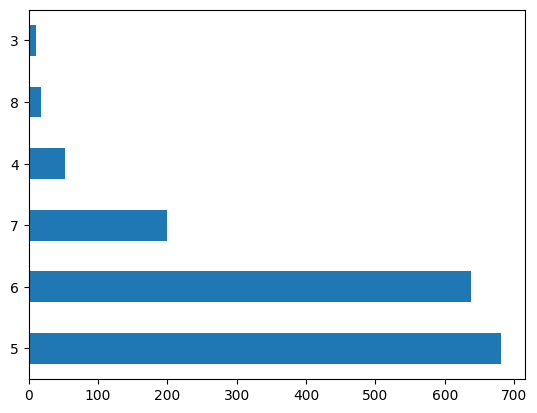

In [ ]:
red_wine_data['quality'].value_counts().plot(kind='barh')

In [ ]:
white_wine_data['quality'].unique()

array([6, 5, 7, 8, 4, 3, 9])

<Axes: >

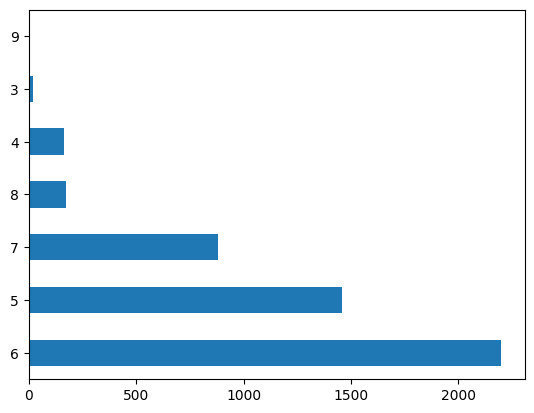

In [ ]:
white_wine_data['quality'].value_counts().plot(kind='barh')

Here I split given original data into training, validation, and test sets with the following proportions:
Training set: 70% of the original data,
Validation set: 15% of the original data &
Test set: 15% of the original data.

c. Train, validate varying at least one hyperparameter, and test at least two types of models: [2]

i. Random forest

ii. Support vector regression with RBF kernel

iii. Neural network with single hidden layer (output layer should have linear activation

# Random forest

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Train Random Forest Model for red wine.

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [2, 5, 10]
}

# Initialize RandomForestRegressor
rf_red = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
grid_red_search = GridSearchCV(estimator=rf_red, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2)

# Fit the grid search to the data
grid_red_search.fit(X_red_val, y_red_val)

# Get the best parameters and model
best_red_params = grid_red_search.best_params_
best_red_model = grid_red_search.best_estimator_
best_red_model.fit(X_red_train, y_red_train)

# # Validate on the validation set
# y_red_val_pred = best_red_model.predict(X_red_val)
# val_red_rmse = mean_squared_error(y_red_val, y_red_val_pred, squared=False)

# Test on the test set
y_red_test_pred = best_red_model.predict(X_red_test)
test_red_rmse = mean_squared_error(y_red_test, y_red_test_pred, squared=False)

print("Best Hyperparameters:", best_red_params)
# print("Validation RMSE:", val_red_rmse)
print("Test RMSE:", test_red_rmse)

# Train Random Forest Model for white wine.

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [2, 5, 10]
}

# Initialize RandomForestRegressor
rf_white = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
grid_white_search = GridSearchCV(estimator=rf_white, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2)

# Fit the grid search to the data
grid_white_search.fit(X_white_val, y_white_val)

# Get the best parameters and model
best_white_params = grid_white_search.best_params_
best_white_model = grid_white_search.best_estimator_
best_white_model.fit(X_white_train, y_white_train)

# # Validate on the validation set
# y_white_val_pred = best_white_model.predict(X_white_val)
# val_white_rmse = mean_squared_error(y_white_val, y_white_val_pred, squared=False)

# Test on the test set
y_white_test_pred = best_white_model.predict(X_white_test)
test_white_rmse = mean_squared_error(y_white_test, y_white_test_pred, squared=False)

print("Best Hyperparameters:", best_white_params)
# print("Validation RMSE:", val_white_rmse)
print("Test RMSE:", test_white_rmse)


Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END .......................max_depth=2, n_estimators=50; total time=   0.1s
[CV] END .......................max_depth=2, n_estimators=50; total time=   0.1s
[CV] END .......................max_depth=2, n_estimators=50; total time=   0.1s
[CV] END ......................max_depth=2, n_estimators=100; total time=   0.1s
[CV] END ......................max_depth=2, n_estimators=100; total time=   0.1s
[CV] END ......................max_depth=2, n_estimators=100; total time=   0.1s
[CV] END ......................max_depth=2, n_estimators=150; total time=   0.2s
[CV] END ......................max_depth=2, n_estimators=150; total time=   0.2s
[CV] END ......................max_depth=2, n_estimators=150; total time=   0.2s
[CV] END .......................max_depth=5, n_estimators=50; total time=   0.1s
[CV] END .......................max_depth=5, n_estimators=50; total time=   0.1s
[CV] END .......................max_depth=5, n_es

#  Neural network with single hidden layer (output layer should have linear activation)

In [ ]:
from sklearn.neural_network import MLPRegressor  # Import MLPRegressor for neural network regression

# Define the neural network model
nn_red_model = MLPRegressor(activation='relu', random_state=42)  # Create a neural network regressor with ReLU activation function

# Define hyperparameters to tune
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (200,)],  # Number of neurons in the hidden layer
    'alpha': [0.0001, 0.001, 0.01]  # L2 regularization parameter
}

# Perform grid search with cross-validation to find the best hyperparameters
grid_red_search = GridSearchCV(nn_red_model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_red_search.fit(X_red_val, y_red_val)  # Fit the grid search to find the best hyperparameters

# Get the best hyperparameters
best_red_params = grid_red_search.best_params_

# Train the model with the best hyperparameters
best_nn_red_model = MLPRegressor(activation='relu', random_state=42, **best_red_params)  # Create the neural network model with the best hyperparameters
best_nn_red_model.fit(X_red_train, y_red_train)  # Fit the model on the training data

# Validate the model
# nn_red_train_predictions = best_nn_red_model.predict(X_red_train)  # Predict on the training data
nn_red_test_predictions = best_nn_red_model.predict(X_red_test)  # Predict on the test data

# Evaluate the model's performance
# train_red_rmse = mean_squared_error(y_red_train, nn_red_train_predictions, squared=False)  # Calculate RMSE for training data
test_red_rmse = mean_squared_error(y_red_test, nn_red_test_predictions, squared=False)  # Calculate RMSE for test data

# Print results
print("Best Hyperparameters:", best_red_params)
# print("Train RMSE:", train_red_rmse)
print("Test RMSE:", test_red_rmse)


# Define the neural network model
nn_white_model = MLPRegressor(activation='relu', random_state=42)  # Create a neural network regressor with ReLU activation function

# Define hyperparameters to tune
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (200,)],  # Number of neurons in the hidden layer
    'alpha': [0.0001, 0.001, 0.01]  # L2 regularization parameter
}

# Perform grid search with cross-validation to find the best hyperparameters
grid_white_search = GridSearchCV(nn_white_model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_white_search.fit(X_white_val, y_white_val)  # Fit the grid search to find the best hyperparameters

# Get the best hyperparameters
best_white_params = grid_white_search.best_params_
# Train the model with the best hyperparameters
best_nn_white_model = MLPRegressor(activation='relu', random_state=42, **best_white_params)  # Create the neural network model with the best hyperparameters
best_nn_white_model.fit(X_white_train, y_white_train)  # Fit the model on the training data

# Validate the model
# nn_white_train_predictions = best_nn_white_model.predict(X_white_train)  # Predict on the training data
nn_white_test_predictions = best_nn_white_model.predict(X_white_test)  # Predict on the test data

# Evaluate the model's performance
# white_train_rmse = mean_squared_error(y_white_train, nn_white_train_predictions, squared=False)  # Calculate RMSE for training data
white_test_rmse = mean_squared_error(y_white_test, nn_white_test_predictions, squared=False)  # Calculate RMSE for test data

# Print results
print("Best Hyperparameters:", best_white_params)
# print("Train RMSE:", white_train_rmse)
print("Test RMSE:", white_test_rmse)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Best Hyperparameters: {'alpha': 0.001, 'hidden_layer_sizes': (200,)}
Test RMSE: 0.6428966988939027


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Best Hyperparameters: {'alpha': 0.01, 'hidden_layer_sizes': (200,)}
Test RMSE: 0.6646729477436394


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


 In this i can't able to resolve this convergence warning because even if i take max itteration value = 1000, it will not converge.

d. Search the net about how to determine the importance of each variable, and find the importance in the final models tried. Comment on whether the same variables are important for different models.

,Feature,Importance
10,alcohol,0.320537
9,sulphates,0.156835
1,volatile acidity,0.110579
6,total sulfur dioxide,0.074192
4,chlorides,0.057067
3,residual sugar,0.054043
8,pH,0.050735
0,fixed acidity,0.046423
7,density,0.044614
5,free sulfur dioxide,0.042850


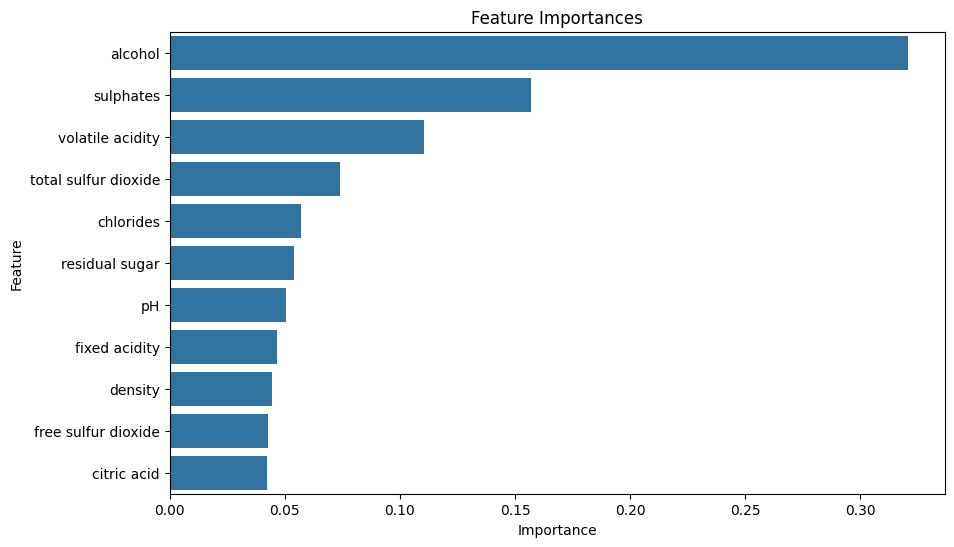

In [ ]:
import numpy as np

# Assuming X_red_train is a NumPy array, we can convert it to a DataFrame
X_red_train_df = pd.DataFrame(X_red_train, columns=red_wine_data.drop('quality', axis=1).columns)

# Get feature importances from the best Random Forest model
red_feature_importances = best_red_model.feature_importances_

# Create a DataFrame to store feature importances along with their corresponding column names
red_importance_df = pd.DataFrame({'Feature': X_red_train_df.columns, 'Importance': red_feature_importances})

# Sort the DataFrame by feature importance in descending order
red_importance_df = red_importance_df.sort_values(by='Importance', ascending=False)

# Print the top features with their importances
display(red_importance_df) # Show the features with their importances in tabular format.

# Plot the feature importances
plt.figure(figsize=(10, 6)) # Fix plot figure size.
sns.barplot(x='Importance', y='Feature', data=red_importance_df) # Shown in bar Plot.
plt.title('Feature Importances') # Head title of plot.
plt.xlabel('Importance') # Title of x-label of Plot (Importances).
plt.ylabel('Feature') # Title of y-label of Plot (Feature).
plt.show()

e. Test the model for red with data from white and vice versa, and comment on whether the model for red wines is applicable to white wines and versa or not.

In [ ]:
# Predict using the Random Forest model trained on red wine data and test on white wine data
rf_red_on_white_predictions = best_red_model.predict(X_white_test)

# Evaluate the performance of the model trained on red wine data and tested on white wine data
rf_red_on_white_rmse = mean_squared_error(y_white_test, rf_red_on_white_predictions, squared=False)
print("RMSE for Red Wine Model tested on White Wine Data:", rf_red_on_white_rmse)

# Predict using the Random Forest model trained on white wine data and test on red wine data
rf_white_on_red_predictions = best_white_model.predict(X_red_test)

# Evaluate the performance of the model trained on white wine data and tested on red wine data
rf_white_on_red_rmse = mean_squared_error(y_red_test, rf_white_on_red_predictions, squared=False)
print("RMSE for White Wine Model tested on Red Wine Data:", rf_white_on_red_rmse)


RMSE for Red Wine Model tested on White Wine Data: 0.8305532670806455
RMSE for White Wine Model tested on Red Wine Data: 0.773981101015512


In both cases we got the RMES value high when we test red wine model on white wine data or vice versa.

# Question-2

2. Classification:

a. Download the data to predict Down syndrome in mice from https://archive.ics.uci.edu/ml/datasets/Mice+Protein+Expression#. The prediction problem is to either predict the genotype (binary) using the gene expression variables from DYRK1A_N to CaNA_N.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Download the dataset (already provided in the URL)
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00342/Data_Cortex_Nuclear.xls"

# Load the data into a pandas DataFrame
data = pd.read_excel(url)

b. Explore, visualize, and pre-process the data as appropriate, including developing a strategy to deal with missing variables. You can choose to impute the variable. The recommended way is to use multivariate feature imputation (https://scikit-learn.org/stable/modules/impute.html)

Explore the data :-

In [ ]:
# Explore the data
# Check the first few rows of the dataset
print("First few rows of the dataset:")
data.head()

First few rows of the dataset:


,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [ ]:
# Check the summary statistics of numerical variables
print("Summary statistics of numerical variables:")
data.describe()

Summary statistics of numerical variables:


,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,...,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,...,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,...,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,...,0.206395,0.136424,0.115554,0.110839,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423
50%,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,1.355846,...,0.224000,0.152313,0.129468,0.121626,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441
75%,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,1.561316,...,0.241655,0.174017,0.148235,0.131955,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824
max,2.516367,2.602662,0.497160,3.757641,8.482553,0.539050,0.317066,7.464070,0.306247,6.113347,...,0.358289,0.282016,0.261506,0.158748,0.256529,0.759588,0.479763,0.360692,0.413903,2.129791


In [ ]:
# Check for missing values
print("Missing values in the dataset:")
print(data.isnull().sum())

Missing values in the dataset:
MouseID      0
DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64


Visualize the data:-

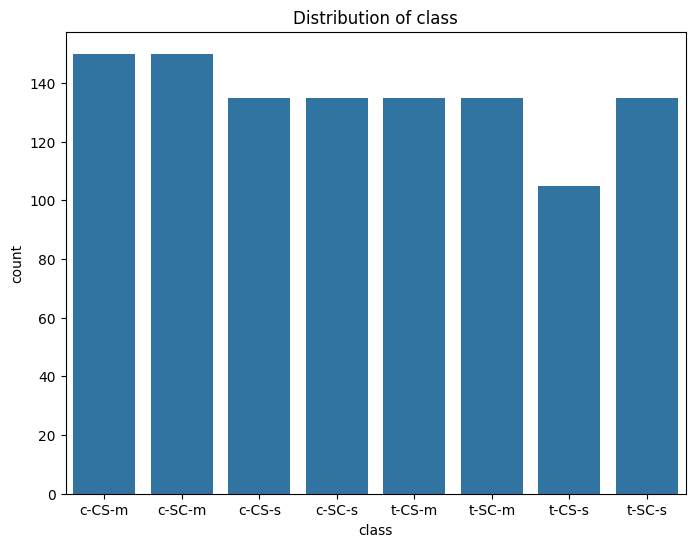

In [ ]:
# Visualize the distribution of the target variable (class)
plt.figure(figsize=(8, 6))
sns.countplot(x='class', data=data)
plt.title('Distribution of class')
plt.show()

Preprocess the data :-

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Drop non-numeric columns if any
data_numeric = data.select_dtypes(include='number')

# Impute missing values using multivariate feature imputation
imputer = IterativeImputer(max_iter=500, random_state=42)
data_imputed = pd.DataFrame(imputer.fit_transform(data_numeric), columns=data_numeric.columns)


In [ ]:
# Convert the target variable to categorical
data_imputed['class'] = data['class'].astype('category')

In [ ]:
# Split features and target variable
X = data_imputed.loc[:, 'DYRK1A_N':'CaNA_N']
y = data_imputed['class']

In [ ]:
# # Pairplots
# sns.pairplot(data_imputed.sample(100), hue='class')
# plt.suptitle('Pairplot of Gene Expression Variables', y=1.02)
# plt.show()

<ipython-input-27-0cbb135a2992>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data_imputed.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)


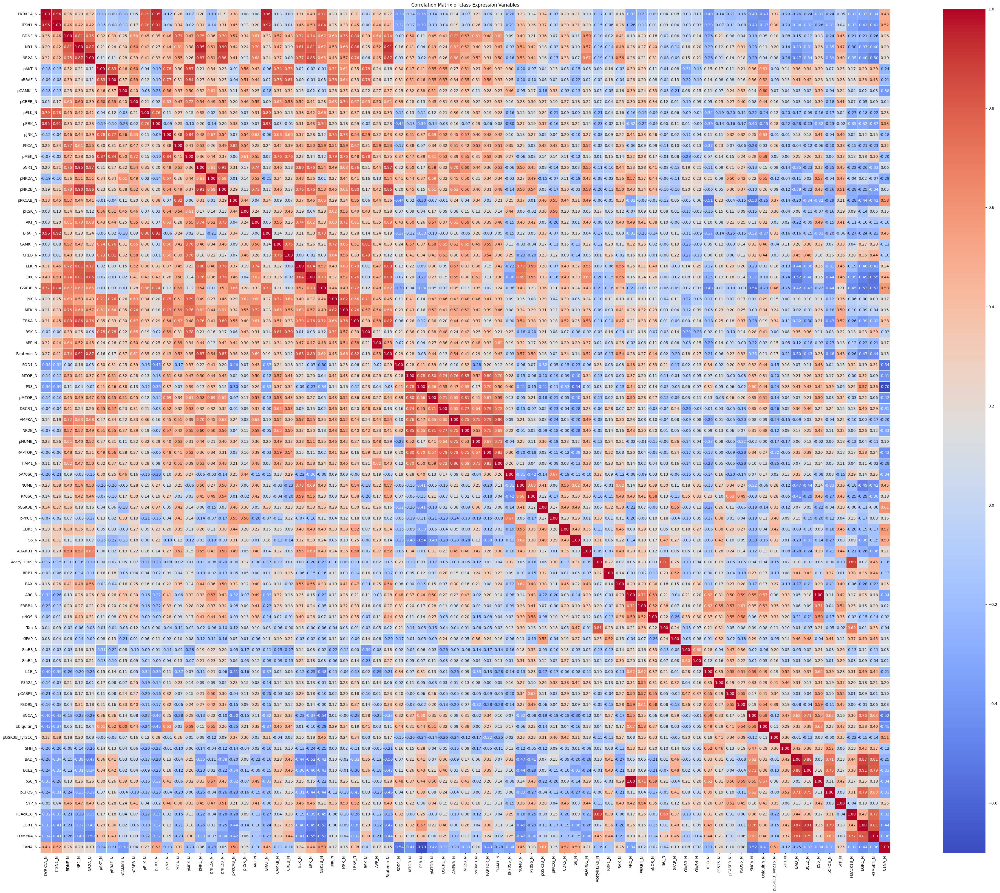

In [ ]:
# Correlation matrix
plt.figure(figsize=(50, 40))
sns.heatmap(data_imputed.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of class Expression Variables')
plt.show()

c. Train, validate varying at least one hyperparameter, and test at least two types of models:

i. Random forest

ii. Support vector classification using RBF kernel

iii. Neural network with single hidden layer (output layer should be have softmax activation)

In [ ]:
# Train a classification model
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


2] Support Vector Classification using RBF Kernel:

In [ ]:
from sklearn.svm import SVC

# Initialize Support Vector Classification with RBF Kernel
svm_classifier = SVC(kernel='rbf')

# Train the model
svm_classifier.fit(X_train, y_train)

SVC()

In [ ]:
# Evaluate the model
# Make predictions on the test set
y_pred_svm = svm_classifier.predict(X_test)

# Calculate accuracy
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print("SVC with RBF Kernel Accuracy:", accuracy_svm)

SVC with RBF Kernel Accuracy: 0.7685185185185185


In [ ]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_svm))

Classification Report:
              precision    recall  f1-score   support

      c-CS-m       0.67      0.62      0.65        32
      c-CS-s       0.62      0.62      0.62        26
      c-SC-m       0.77      1.00      0.87        27
      c-SC-s       0.90      0.79      0.84        34
      t-CS-m       0.64      0.84      0.73        19
      t-CS-s       0.93      0.64      0.76        22
      t-SC-m       0.85      0.68      0.76        25
      t-SC-s       0.83      0.94      0.88        31

    accuracy                           0.77       216
   macro avg       0.78      0.77      0.76       216
weighted avg       0.78      0.77      0.77       216



3] Neural Network with Single Hidden Layer:

In [ ]:
from sklearn.neural_network import MLPClassifier

# Initialize Neural Network with Single Hidden Layer
mlp_classifier = MLPClassifier(
    hidden_layer_sizes=(100,),
    activation='relu',
    solver='adam',
    random_state=42,
    max_iter=200,  # Set maximum number of iterations
    early_stopping=True,  # Enable early stopping
    validation_fraction=0.1,  # Fraction of training data to use as validation set
    n_iter_no_change=10,  # Number of iterations with no improvement to wait before stopping
    verbose=True  # Print progress messages
)

# Train the model
mlp_classifier.fit(X_train, y_train)

Iteration 1, loss = 2.80936021
Validation score: 0.218391
Iteration 2, loss = 2.36580680
Validation score: 0.149425
Iteration 3, loss = 2.20679405
Validation score: 0.137931
Iteration 4, loss = 2.14033710
Validation score: 0.206897
Iteration 5, loss = 2.09792508
Validation score: 0.045977
Iteration 6, loss = 2.07975452
Validation score: 0.103448
Iteration 7, loss = 2.06038160
Validation score: 0.103448
Iteration 8, loss = 2.03159145
Validation score: 0.160920
Iteration 9, loss = 2.00563727
Validation score: 0.206897
Iteration 10, loss = 1.98005463
Validation score: 0.298851
Iteration 11, loss = 1.95860091
Validation score: 0.321839
Iteration 12, loss = 1.94070074
Validation score: 0.310345
Iteration 13, loss = 1.91911391
Validation score: 0.298851
Iteration 14, loss = 1.89820019
Validation score: 0.310345
Iteration 15, loss = 1.87545497
Validation score: 0.298851
Iteration 16, loss = 1.85467015
Validation score: 0.321839
Iteration 17, loss = 1.83154895
Validation score: 0.356322
Iterat

MLPClassifier(early_stopping=True, random_state=42, verbose=True)

In [ ]:
# Evaluate the model
# Make predictions on the test set
y_pred_mlp = mlp_classifier.predict(X_test)

# Calculate accuracy
accuracy_mlp = accuracy_score(y_test, y_pred_mlp)
print("Neural Network with Single Hidden Layer Accuracy:", accuracy_mlp)

Neural Network with Single Hidden Layer Accuracy: 0.8472222222222222


In [ ]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_mlp))

Classification Report:
              precision    recall  f1-score   support

      c-CS-m       0.74      0.72      0.73        32
      c-CS-s       0.73      0.62      0.67        26
      c-SC-m       0.87      1.00      0.93        27
      c-SC-s       1.00      0.88      0.94        34
      t-CS-m       0.70      0.74      0.72        19
      t-CS-s       0.92      1.00      0.96        22
      t-SC-m       1.00      0.84      0.91        25
      t-SC-s       0.81      0.97      0.88        31

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.84       216
weighted avg       0.85      0.85      0.85       216



d. See if removing some features systematically will improve your models using recursive feature elimination https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFECV.html).

Feature Elimination in Support Vector Classification using RBF Kernel:

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.svm import LinearSVC

# Initialize Support Vector Classification with RBF Kernel
svm_classifier = SVC(kernel='linear')

# Initialize RFECV
rfecv_svm = RFECV(estimator=svm_classifier, step=1, cv=5, scoring='accuracy')

# Fit RFECV
rfecv_svm.fit(X_train, y_train)

# Get the selected features
selected_features_svm = X_train.columns[rfecv_svm.support_]

# Train the model using selected features
svm_classifier.fit(X_train[selected_features_svm], y_train)

# Evaluate performance on the test set
y_pred_svm = svm_classifier.predict(X_test[selected_features_svm])
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print("SVC with RBF Kernel Accuracy (with selected features):", accuracy_svm)

SVC with RBF Kernel Accuracy (with selected features): 0.9398148148148148


In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 864 entries, 1009 to 860
Data columns (total 77 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   DYRK1A_N         864 non-null    float64
 1   ITSN1_N          864 non-null    float64
 2   BDNF_N           864 non-null    float64
 3   NR1_N            864 non-null    float64
 4   NR2A_N           864 non-null    float64
 5   pAKT_N           864 non-null    float64
 6   pBRAF_N          864 non-null    float64
 7   pCAMKII_N        864 non-null    float64
 8   pCREB_N          864 non-null    float64
 9   pELK_N           864 non-null    float64
 10  pERK_N           864 non-null    float64
 11  pJNK_N           864 non-null    float64
 12  PKCA_N           864 non-null    float64
 13  pMEK_N           864 non-null    float64
 14  pNR1_N           864 non-null    float64
 15  pNR2A_N          864 non-null    float64
 16  pNR2B_N          864 non-null    float64
 17  pPKCAB_N     

In [ ]:
X_train.columns

Index(['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N',
       'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N',
       'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N',
       'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N',
       'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N',
       'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N',
       'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N',
       'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'RRP1_N',
       'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N', 'GluR3_N',
       'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N',
       'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N',
       'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N'],
      dtype='object')

In [ ]:
selected_features_svm.shape

(63,)

It is eliminating 14 feature and it's accuracy increasses from 0.7685185185185185 to 0.9398148148148148 while we test it in SVM model.

# Question-3

3. Practice using pre-trained neural networks to extract domain-specific features for new tasks.

a. Read the pytorch tutorial to use a pre-trained “ConvNet as fixed feature extractor” from https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html and you can ignore “finetuning the ConvNet”. Test this code out to see if it runs properly in your environment after eliminating code blocks that you do not need.

In [ ]:
# For tips on running notebooks in Google Colab, see
# https://pytorch.org/tutorials/beginner/colab
%matplotlib inline

In [ ]:
# License: BSD
# Author: Sasank Chilamkurthy

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory

cudnn.benchmark = True
plt.ion()   # interactive mode

Load Data :-

In [ ]:
import zipfile

# Path to the zip file
zip_file_path = '/content/hymenoptera_data.zip'  # Update with the path to your zip file

# Directory to extract the contents to
extract_to_directory = '/content'  # You can change this to your desired directory

# Create the directory if it doesn't exist
#!mkdir -p "{extract_to_directory}"

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_directory)

print("Zip file extracted successfully to:", extract_to_directory)

Zip file extracted successfully to: /content


In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = '/content/hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Visualize a few images :-

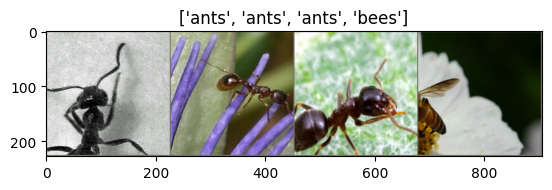

In [ ]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

Training the model :-

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

Visualizing the model predictions :-

In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

ConvNet as fixed feature extractor :-

In [ ]:
model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 128MB/s]


Train and evaluate :-

In [ ]:
model_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.6486 Acc: 0.6352
val Loss: 0.2306 Acc: 0.9412

Epoch 1/24
----------
train Loss: 0.4331 Acc: 0.7869
val Loss: 0.1779 Acc: 0.9281

Epoch 2/24
----------
train Loss: 0.4196 Acc: 0.8156
val Loss: 0.4921 Acc: 0.7908

Epoch 3/24
----------
train Loss: 0.5773 Acc: 0.7582
val Loss: 0.1825 Acc: 0.9542

Epoch 4/24
----------
train Loss: 0.5427 Acc: 0.7295
val Loss: 0.1754 Acc: 0.9412

Epoch 5/24
----------
train Loss: 0.3635 Acc: 0.8361
val Loss: 0.3475 Acc: 0.8693

Epoch 6/24
----------
train Loss: 0.3622 Acc: 0.8361
val Loss: 0.1845 Acc: 0.9281

Epoch 7/24
----------
train Loss: 0.3093 Acc: 0.8648
val Loss: 0.1820 Acc: 0.9412

Epoch 8/24
----------
train Loss: 0.3378 Acc: 0.8730
val Loss: 0.1831 Acc: 0.9477

Epoch 9/24
----------
train Loss: 0.3792 Acc: 0.8525
val Loss: 0.1701 Acc: 0.9412

Epoch 10/24
----------
train Loss: 0.3856 Acc: 0.8443
val Loss: 0.1993 Acc: 0.9346

Epoch 11/24
----------
train Loss: 0.3534 Acc: 0.8320
val Loss: 0.1979 Acc: 0.9216

Ep

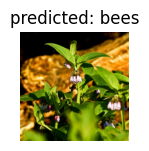

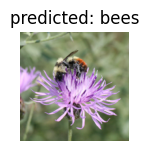

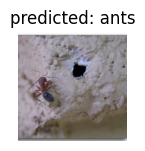

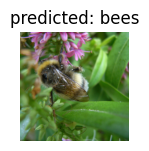

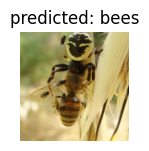

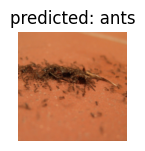

In [ ]:
 visualize_model(model_conv)

plt.ioff()
plt.show()

b. Write a function that outputs ResNet18 features for a given input image. Extract features for training images (in image_datasets['train']). You should get an Nx512 dimensional array.

In [ ]:
import os
import numpy as np

def extract_resnet18_features_for_dataset(dataset, model):
    features_list = []
    labels_list = []

    for inputs, labels in dataset:
        with torch.no_grad():
            outputs = model(inputs)
        features = outputs.squeeze().numpy()
        features_list.append(features)
        labels_list.append(labels.numpy())

    features_array = np.concatenate(features_list)
    labels_array = np.concatenate(labels_list)

    return features_array, labels_array

# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model = torch.nn.Sequential(*(list(model.children())[:-1]))
model.eval()

# Extract features for the entire training dataset
train_features, train_labels = extract_resnet18_features_for_dataset(dataloaders['train'], model)

print("Train Features shape:", train_features.shape)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Train Features shape: (244, 512)


c. Compare RBF kernel SVM (do grid search on kernel width and regularization) and random forest (do grid search on max depth and number of trees). Test the final model on test data and show the results -- accuracy and F1 score.

In [ ]:
import os
import numpy as np

def extract_resnet18_features_for_dataset(dataset, model):
    features_list = []
    labels_list = []

    for inputs, labels in dataset:
        with torch.no_grad():
            outputs = model(inputs)
        features = outputs.squeeze().numpy()

        # Ensure the features have consistent dimensions
        if len(features.shape) == 1:
            features = np.expand_dims(features, axis=0)

        features_list.append(features)
        labels_list.append(labels.numpy())

    features_array = np.concatenate(features_list)
    labels_array = np.concatenate(labels_list)

    return features_array, labels_array

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score

# SVM with RBF kernel
svm_params = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10]}
svm_classifier = GridSearchCV(SVC(kernel='rbf'), svm_params, cv=5)
svm_classifier.fit(train_features, train_labels)

print("Best parameters for SVM:", svm_classifier.best_params_)

# Random Forest
rf_params = {'max_depth': [None, 10, 20], 'n_estimators': [50, 100, 200]}
rf_classifier = GridSearchCV(RandomForestClassifier(), rf_params, cv=5)
rf_classifier.fit(train_features, train_labels)

print("Best parameters for Random Forest:", rf_classifier.best_params_)

dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=4,
                                         shuffle=True, num_workers=2),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=4,
                                       shuffle=False, num_workers=2)
}


# Evaluate models on test dataset
test_features, test_labels = extract_resnet18_features_for_dataset(dataloaders['val'], model)

# SVM evaluation
svm_pred = svm_classifier.predict(test_features)
svm_accuracy = accuracy_score(test_labels, svm_pred)
svm_f1 = f1_score(test_labels, svm_pred, average='weighted')

print("SVM - Accuracy:", svm_accuracy)
print("SVM - F1 Score:", svm_f1)

# Random Forest evaluation
rf_pred = rf_classifier.predict(test_features)
rf_accuracy = accuracy_score(test_labels, rf_pred)
rf_f1 = f1_score(test_labels, rf_pred, average='weighted')

print("Random Forest - Accuracy:", rf_accuracy)
print("Random Forest - F1 Score:", rf_f1)

Best parameters for SVM: {'C': 0.1, 'gamma': 0.1}
Best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 200}
SVM - Accuracy: 0.45751633986928103
SVM - F1 Score: 0.28722998915560244
Random Forest - Accuracy: 0.9673202614379085
Random Forest - F1 Score: 0.9673005519501272


4. Deploy one model from part 1 on a local webserver with a web frontend (e.g. using streamlit). Add some GUI elements, such as sliders for acidity, citrus etc.

In [ ]:
pip install streamlit


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.0
    Uninstalling packaging-24.0:
      Successfully uninstalled packaging-24.0


In [38]:
import pickle
# Save the model to a file
with open('linear_regression_model.pkl', 'wb') as f:
    pickle.dump(best_red_model, f)

In [39]:
import pickle
# Save the model to a file
with open('linear_regression_model_1.pkl', 'wb') as f_1:
    pickle.dump(best_white_model, f_1)

In [40]:
! pip install streamlit -q

In [41]:
!wget -q -O - ipv4.icanhazip.com

34.133.86.143


In [42]:
! streamlit run app.py & npx localtunnel --port 8501




  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://34.133.86.143:8501

npx: installed 22 in 2.687s
your url is: https://deep-glasses-admire.loca.lt
  Stopping...
^C
